<a href="https://colab.research.google.com/github/twishi03/Data/blob/main/Demo%20MERFISH%20Vizgen.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Vizgen Mouse Brain Receptor Map Colab Notebook  (UMAP-Learn 0.5.2)

The [Vizgen Mouse Brain Receptor Map](https://vizgen.com/support/data-release-program/) measured 483 genes across 9 full coronal slices. This Colab notebook loads and visualizes single cell transcriptomics and imaging data from a Vizgen MERFISH experiment including:

1.   DAPI staining across the full tissue slice
2.   Detected transcripts across the full tissue slice
3.   Detected transcripts, DAPI image, and cell boundaries within a single field of view

In addition the notebook performs single-cell analysis to cluster cell types and visualizes:
1.   UMAP and spatial single-cell views colored by the cell clusters
2.   Heatmap of the gene expression within each cell type cluster

## Notebook Overview Video
This tutorial walks users through Vizgen's MERFISH Mouse Brain Receptor Map Jupyter notebook and shows users how to execute the notebook on Google Colab. The notebook sections can be run independently and the entire notebook takes about 40 minutes to run.

# Required Initialization

This section runs authentication and sets paths for our data. Accessing the data requires authentication via Google. Please follow the instructions that appear after running the first cell to access the dataset, which include clicking a link, authenticating and enabling Google storage access, and copying a code back into the cell.

In [1]:
# Authenticate
from google.colab import auth
auth.authenticate_user()

# Initial Imports
!pip install -q observable_jupyter==0.1.10
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from copy import deepcopy
from observable_jupyter import embed
from math import cos, sin

# Paths to Data
base_path = 'gs://public-datasets-vizgen-merfish/datasets/mouse_brain_map/BrainReceptorShowcase/'

slice_num = 2
replicate_num = 1

dataset_name = 'Slice' + str(slice_num) + '/Replicate' + str(replicate_num) + '/'
dataset_suffix = '_S' + str(slice_num) + 'R' + str(replicate_num)
z_index_number = 2
fov = 75

# Section 2: Single Cell and Spatial Analysis

Vizgen MERSCOPE automatically segments the cells in the MERFISH measurement. This immediately enables single cell analysis. The key files for single cell analysis are:

### cell_by_gene
A matrix of cells by genes (cell columns and gene rows) indicating the number of measured transcripts of each gene detected within each cell.

### cell_metadata

The cell metadata file contains the spatial metadata for each of the detected cells, including the following columns:

* fov: the field of view where the cell was visualized
* volume: the volume of the cell in global coordinates
* center_x: the center of the cell in the x coordinate
* center_y: the center of the cell in the y coordinate
* min_x: the minimum position of the cell in the x coordinate
* max_x: the maximum position of the cell in the x coordinate
* min_y: the maximum position of the cell in the y coordinate
* max_y: the maximum position of the cell in the y coordinate
* barcodeCount: the number of transcript in the cell

This notebook demonstrates how we can analyze Vizgen's single-cell spatial transcriptomics data using the single-cell data analysis library Scanpy to identify cell clusters and visualize these clusters within the mouse brain.

#### Installation and Imports

In [2]:
%%capture
!pip install -q fsspec
!pip install -q gcsfs
!pip install -q scanpy
!pip install -q leidenalg
!pip install -q observable_jupyter
!pip install -q clustergrammer2
!pip install -q loompy

# not pinning to previous 0.5.1 version
# scanpy grabs umap-learn==0.5.2 (see below)
###########################################
# !pip install -q umap-learn==0.5.1

# code for compressing data for visuals
import zlib, json, base64
def json_zip(j):
    zip_json_string = base64.b64encode(
        zlib.compress(
            json.dumps(j).encode('utf-8')
        )
    ).decode('ascii')
    return zip_json_string

import pandas as pd
import scanpy as sc
from matplotlib import pyplot as plt
from observable_jupyter import embed
from clustergrammer2 import net, Network, CGM2
from scipy.stats.stats import pearsonr
from copy import deepcopy

# Avoids scroll-in-the-scroll in the entire Notebook
from IPython.display import Javascript
def resize_colab_cell():
  display(Javascript('google.colab.output.setIframeHeight(0, true, {maxHeight: 5000})'))
get_ipython().events.register('pre_run_cell', resize_colab_cell)

In [3]:
import umap
umap.__version__

<IPython.core.display.Javascript object>

'0.5.3'

## Load cell by gene matrix and cell metadata and construct AnnData object

In [4]:
cell_by_gene = pd.read_csv(base_path + dataset_name + 'cell_by_gene' + dataset_suffix + '.csv', index_col=0)
cells = cell_by_gene.index.tolist()
meta_cell = pd.read_csv(base_path + dataset_name + 'cell_metadata' + dataset_suffix + '.csv', index_col=0)
meta_cell['barcodeCount'] = cell_by_gene.sum(axis=1)
meta_cell = meta_cell.loc[cells]
meta_cell.index = range(len(meta_cell.index.tolist()))

# initialize meta_gene
meta_gene = pd.DataFrame(index=cell_by_gene.columns.tolist())

# drop blanks for single cell analysis
keep_genes = [x for x in cell_by_gene.columns.tolist() if 'Blank' not in x]

cell_by_gene = cell_by_gene[keep_genes]
meta_gene = meta_gene.loc[keep_genes]

meta_gene['expression'] = cell_by_gene.sum(axis=0)

ad_viz = sc.AnnData(X=cell_by_gene.values, obs=meta_cell, var=meta_gene)

ad_viz

<IPython.core.display.Javascript object>

/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 83546 × 483
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'barcodeCount'
    var: 'expression'

## Cluster Gene Expression Data
Here we load the Vizgen single cell gene expression data into Scanpy to perform preprocessing (normalization and log transformation), dimensionality reduction (PCA, neighbohood calculation, UMAP), and clustering (Leiden clustering)

In [5]:
%%capture

resolution = 1.0

# Leiden Clustering
######################
sc.pp.normalize_total(ad_viz)
sc.pp.log1p(ad_viz)
sc.pp.scale(ad_viz, max_value=10)
sc.tl.pca(ad_viz, svd_solver='arpack')
sc.pp.neighbors(ad_viz, n_neighbors=10, n_pcs=20)
sc.tl.umap(ad_viz)
sc.tl.leiden(ad_viz, resolution=resolution)

# Calculate Leiden Signatures
#########################################
ser_counts = ad_viz.obs['leiden'].value_counts()
ser_counts.name = 'cell counts'
meta_leiden = pd.DataFrame(ser_counts)

cat_name = 'leiden'
sig_leiden = pd.DataFrame(columns=ad_viz.var_names, index=ad_viz.obs[cat_name].cat.categories)
for clust in ad_viz.obs[cat_name].cat.categories:
    sig_leiden.loc[clust] = ad_viz[ad_viz.obs[cat_name].isin([clust]),:].X.mean(0)
sig_leiden = sig_leiden.transpose()
leiden_clusters = ['Leiden-' + str(x) for x in sig_leiden.columns.tolist()]
sig_leiden.columns = leiden_clusters
meta_leiden.index = sig_leiden.columns.tolist()
meta_leiden['leiden'] = pd.Series(meta_leiden.index.tolist(), index=meta_leiden.index.tolist())

# generate colors for categories by plotting
sc.pl.umap(ad_viz, color="leiden", legend_loc='on data')
cats = ad_viz.obs['leiden'].cat.categories.tolist()
colors = list(ad_viz.uns['leiden_colors'])
cat_colors = dict(zip(cats, colors))

# colors for clustergrammer2
ser_color = pd.Series(cat_colors)
ser_color.name = 'color'
df_colors = pd.DataFrame(ser_color)
df_colors.index = ['Leiden-' + str(x) for x in df_colors.index.tolist()]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


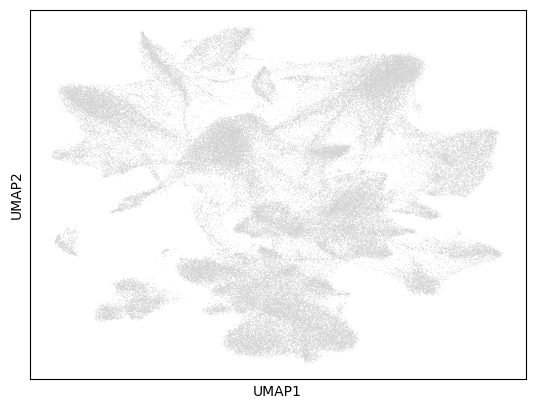

In [6]:
sc.pl.umap(ad_viz)

## Hierarchically Cluster Leiden Gene Expressin Data

In [7]:
meta_gene['info'] = pd.Series('', index=meta_gene.index.tolist())

glial_markers = ['Aqp4', 'Slc25a18', 'Mlc1', 'Gfap']
meta_gene.loc[glial_markers, 'info'] = 'Glial markers'

gabaergic_genes = ['Gad1', 'Slc32a1']
meta_gene.loc[gabaergic_genes, 'info'] = 'GABAergic markers'

df_colors.loc[''] = 'white'

<IPython.core.display.Javascript object>

In [8]:
net = Network(CGM2)
# net.load_df(sig_leiden, meta_col=meta_leiden, col_cats=['cell counts'])
net.load_df(sig_leiden, meta_col=meta_leiden, col_cats=['leiden', 'cell counts'],
            meta_row=meta_gene, row_cats=['info', 'expression'])
net.filter_threshold(0.01, axis='row')
net.normalize(axis='row', norm_type='zscore')
net.set_global_cat_colors(df_colors)
net.cluster()

<IPython.core.display.Javascript object>

#### Code for Observable embed visual

In [9]:
%%capture
# Collect data for interactive visualization
################################################

cell_by_gene.index = range(len(cell_by_gene.index.tolist()))
gex_int = cell_by_gene.astype(np.int)

gex_dict = {}
for inst_gene in gex_int.columns.tolist():
    if 'Blank' not in inst_gene:
        ser_gene = gex_int[inst_gene]
        ser_gene = ser_gene[ser_gene > 0]
        ser_gene = ser_gene.astype(np.int8)
        gex_dict[inst_gene] = ser_gene.to_dict()


df_pos = ad_viz.obs[['center_x', 'center_y', 'leiden']]
df_pos[['center_x', 'center_y']] = df_pos[['center_x', 'center_y']].round(2)
df_pos.columns = ['x', 'y', 'leiden']
df_pos['y'] = -df_pos['y']
df_umap = ad_viz.obsm.to_df()[['X_umap1', 'X_umap2']].round(2)
df_umap.columns = ['umap-x', 'umap-y']

# rotate the mouse brain to the upright position
theta = np.deg2rad(-15)
rot = np.array([[cos(theta), -sin(theta)], [sin(theta), cos(theta)]])
df_pos[['x', 'y']] = df_pos[['x', 'y']].dot(rot)

df_name = pd.DataFrame(df_pos.index.tolist(), index=df_pos.index.tolist(), columns=['name'])

df_obs = pd.concat([df_name, df_pos, df_umap], axis=1)
data = df_obs.to_dict('records')

obs_data = {
    'gex_dict': gex_dict,
    'data': data,
    'cat_colors': cat_colors,
    'network': net.viz
}

zip_obs_data = json_zip(obs_data)

inputs = {
    'zoom': -3.5,
    'ini_cat': 'leiden',
    'ini_map_type': 'UMAP',
    'ini_min_radius': 1.75,
    'zip_obs_data': zip_obs_data,
    'gex_opacity_contrast_scale': 0.85
}

<IPython.core.display.Javascript object>

## UMAP-Spatial-Heatmap Single-Cell View

Here we visualize Vizgen single-cell gene expression data using an interacive scatterplot and heatmap. On the left, cells can be arranged based on their spatial location in the tissue or based on their dimensionality reduced UMAP embedding. Cells can be colored using their Leiden cluster or the expression of any gene. Genes can be selected from the dropdown above the scatterplot or by clicking a gene row in the interactive heatmap built using [clustergrammer2](https://github.com/ismms-himc/clustergrammer2) and will color cells based on the expression of this gene. The heatmap can also be used to identify genes that are correlated across leiden clusters, as well as the hierarchy of cell-cluster gene expression. This visual enabels users to interactively explore Vizgen's high-dimensional gene expression data and simultaneously observe the spatial locations/morphologies of single-cells in the tissue. The spatial distribution of cell can also be compared to brain mapping projects including the [Allen Brain Atlas](https://portal.brain-map.org/) and [Kim Lab Brain Map](https://kimlab.io/brain-map/atlas/atlas_viewer.html?s=60_AP-1.6&l=81). See below for more in-depth discussion of selected cell-clusters.



In [10]:
embed('@vizgen/umap-spatial-heatmap-single-cell-0-3-0', cells=['viewof cgm', 'dashboard'], inputs=inputs, display_logo=False)

<IPython.core.display.Javascript object>